In [3]:
%load_ext autoreload
%autoreload 2

import os

import h5py
import torch
import numpy as np
import argparse

from matplotlib import pyplot as plt
from matplotlib.colors import Normalize

import sys
sys.path.insert(1, '..')

from trainers.pix2pix_trainer import *
from utils.YParams import YParams
from utils.viz import *
from utils.weighted_acc_rmse import *
from utils.spectra_metrics import *

n_gpu = 0
if torch.cuda.is_available():
    n_gpu = torch.cuda.device_count()
    
os.environ['HDF5_USE_FILE_LOCKING'] = 'FALSE'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
config = 'bs64_nopad'
root_dir = '/pscratch/sd/j/jpduncan/tsitprecip/era5demo'
# checkpoint_path = os.path.join(root_dir, 'expts', config, 'checkpoints/ckpt.tar')

parser = argparse.ArgumentParser()
parser.add_argument("--yaml_config", default='./config/tsit.yaml', type=str)
parser.add_argument("--config", default='base', type=str)
parser.add_argument("--root_dir", default='./', type=str, help='root dir to store results')
parser.add_argument("--amp", action='store_true')
parser.add_argument("--sweep_id", default=None, type=str, help='sweep config from ./configs/sweeps.yaml')
args = parser.parse_args(['--config', config, '--root_dir', root_dir, '--amp'])

params = YParams(os.path.abspath('../config/tsit.yaml'), config)
params.update_params({
    'log_to_wandb': False,
    'save_checkpoint': False,
    'batch_size': 1,
    'num_data_workers': 1,
})

trainer = Pix2PixTrainer(params, args)
trainer.build()
trainer.pix2pix_model.set_eval()

2022-06-11 00:42:32,836 - root - INFO - ------------------ Configuration ------------------
2022-06-11 00:42:32,836 - root - INFO - Configuration file: /global/u1/j/jpduncan/intern/TSIT_ERA5/config/tsit.yaml
2022-06-11 00:42:32,837 - root - INFO - Configuration name: bs64_nopad
2022-06-11 00:42:32,837 - root - INFO - batch_size 1
2022-06-11 00:42:32,837 - root - INFO - use_periodic_padding False
2022-06-11 00:42:32,838 - root - INFO - norm_G fadebatch3x3
2022-06-11 00:42:32,838 - root - INFO - num_data_workers 1
2022-06-11 00:42:32,838 - root - INFO - in_channels [0, 1, 2, 3, 17, 18, 19]
2022-06-11 00:42:32,838 - root - INFO - out_channels [0]
2022-06-11 00:42:32,839 - root - INFO - train_data_path /pscratch/sd/s/shas1693/data/era5/train
2022-06-11 00:42:32,839 - root - INFO - valid_data_path /pscratch/sd/s/shas1693/data/era5/test
2022-06-11 00:42:32,839 - root - INFO - min_path /pscratch/sd/s/shas1693/data/era5/mins.npy
2022-06-11 00:42:32,839 - root - INFO - max_path /pscratch/sd/s/s

Network [TSITGenerator] was created. Total number of parameters: 331.4 million. To see the architecture, do print(network).


2022-06-11 00:42:51,220 - root - INFO - Loading checkpoint /pscratch/sd/j/jpduncan/tsitprecip/era5demo/expts/bs64_nopad/checkpoints/ckpt.tar


Network [MultiscaleDiscriminator] was created. Total number of parameters: 5.5 million. To see the architecture, do print(network).


torch.Size([7, 512, 1024])
torch.Size([1, 512, 1024])


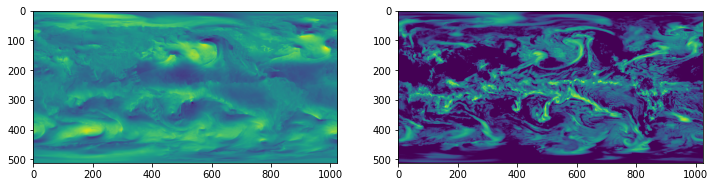

In [5]:
samp = trainer.valid_dataset.__getitem__(0)
inp = samp[0]
tar = samp[1]

print(inp.shape)
print(tar.shape)

plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(inp[0])

plt.subplot(1,2,2)
plt.imshow(tar[0])

plt.show()

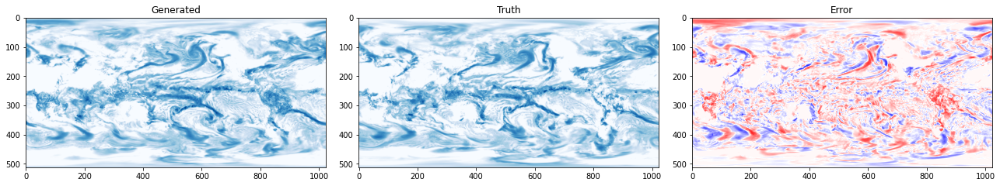

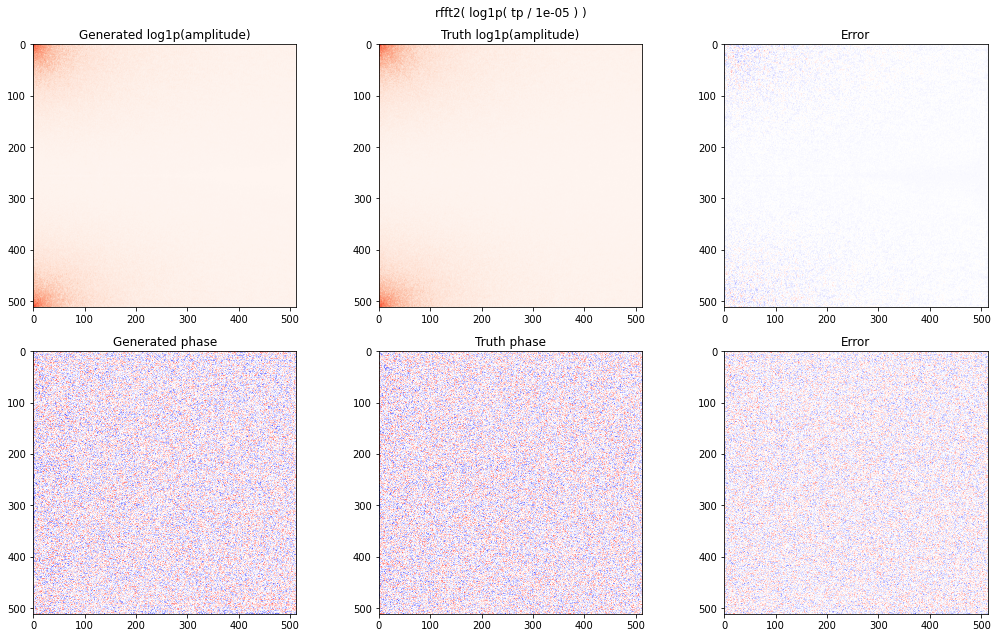

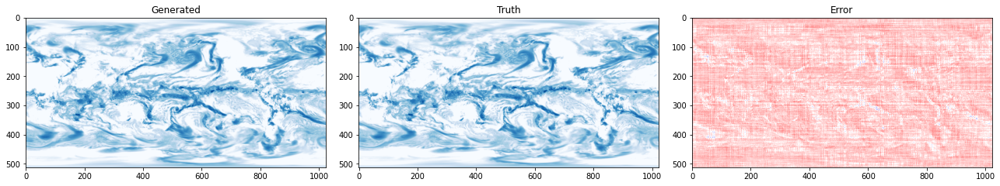

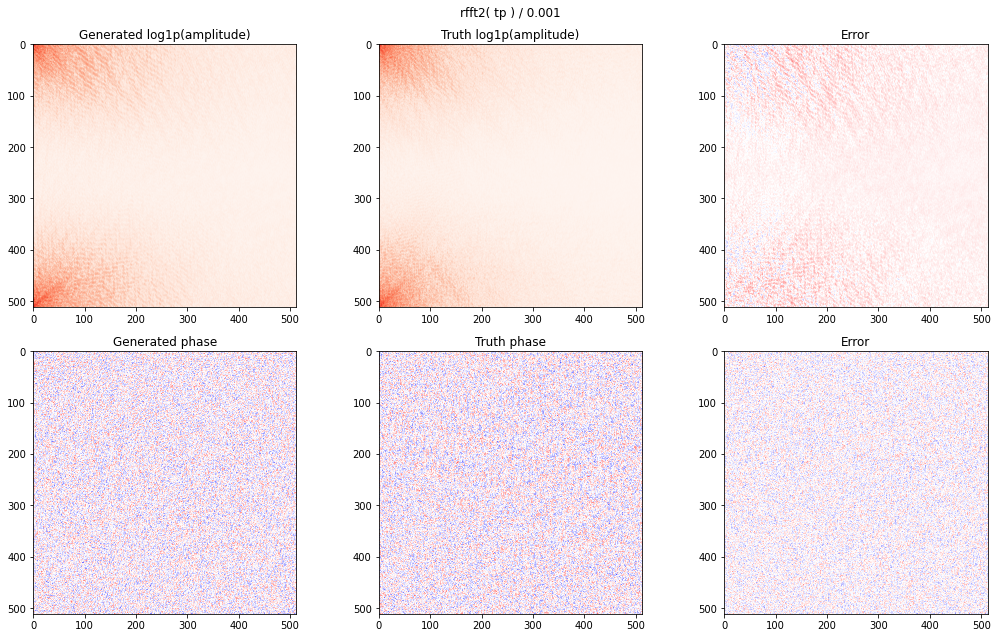

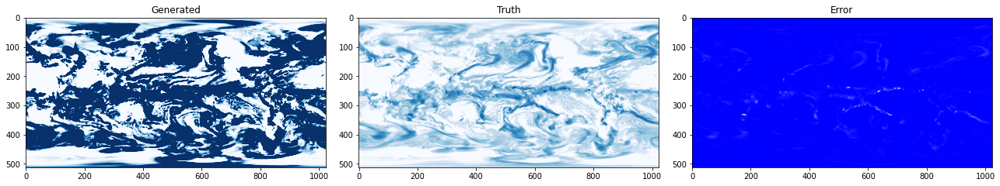

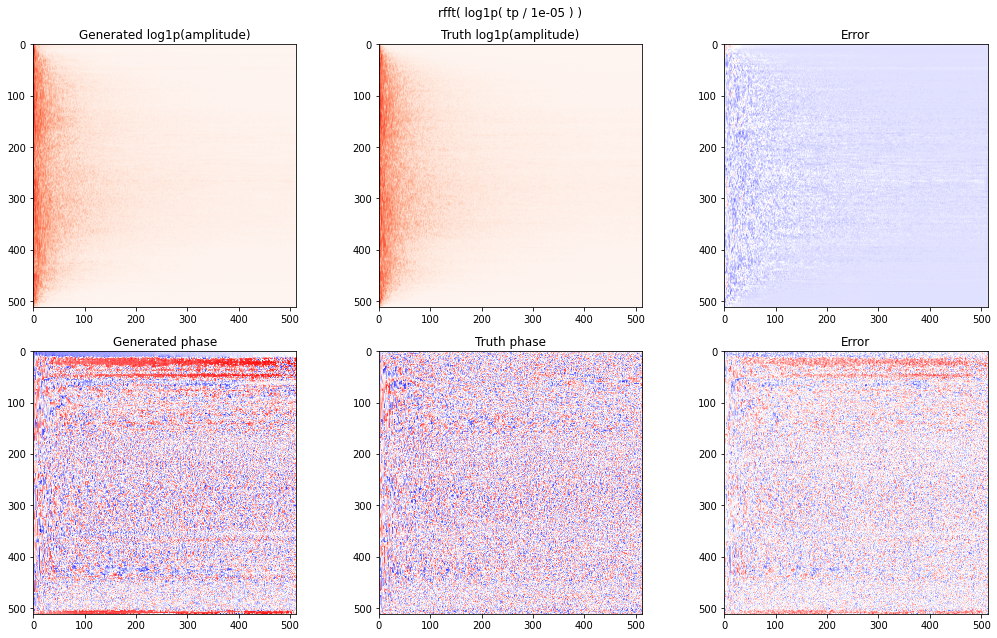

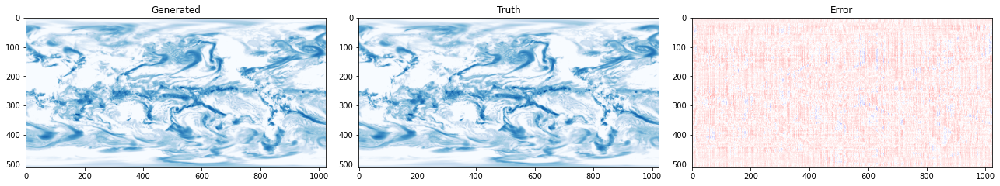

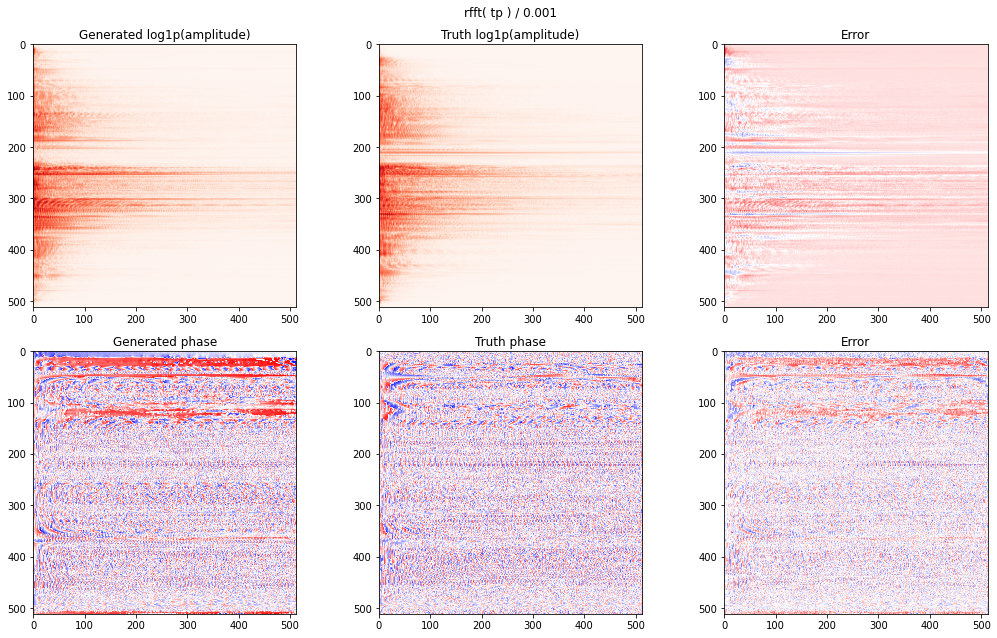

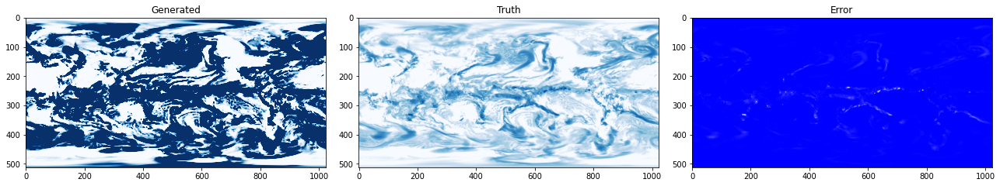

In [22]:
fields = {}
spectra = {}
spectra_sc = {}
field_metrics = {}
spec_metrics = {}
spec_sc_metrics = {}

# after unlog_tp, scale spectra by 1/spectra_eps
spectra_eps = 1e-3

spectra_fns = {
    'rfft2': spectra_metrics_rfft2,
    'rfft': spectra_metrics_rfft
}
inv_fft = {
    'rfft2': torch.fft.irfft2,
    'rfft': torch.fft.irfft,
}

with torch.inference_mode():
    
    for i in range(10):
    
        samp = trainer.valid_dataset[i]
        data = (samp[0][None, :].to(trainer.device), samp[1][None, :].to(trainer.device))

        # gen = torch.log1p(trainer.generate_validation(data)/1e-5).cpu().numpy()[0]
        gen = trainer.generate_validation(data)

        gen_unlog = unlog_tp_torch(gen, trainer.params.precip_eps)
        tar_unlog = unlog_tp_torch(data[1], trainer.params.precip_eps)

        field_metrics.setdefault('acc', []).append(weighted_acc_torch_channels(gen_unlog, tar_unlog).item())
        field_metrics.setdefault('rmse', []).append(weighted_rmse_torch_channels(gen_unlog, tar_unlog).item())

        fields.setdefault('pred', []).append(gen[0].cpu().numpy())
        fields.setdefault('target', []).append(data[1][0].cpu().numpy())

        for name, spectra_metrics_fn in spectra_fns.items():

                metrics_sc = spectra_metrics_fn(gen_unlog, tar_unlog, eps=spectra_eps)
                metrics = spectra_metrics_fn(gen, data[1])

                pred_fft = metrics.pop('pred_fft')[0, 0].cpu().numpy()
                tar_fft = metrics.pop('tar_fft')[0, 0].cpu().numpy()

                spectra.setdefault(name, {}).setdefault('pred', []).append(pred_fft)
                spectra[name].setdefault('target', []).append(tar_fft)

                spectra_sc.setdefault(name, {}).setdefault('pred', []).append(metrics_sc.pop('pred_fft')[0, 0].cpu().numpy())
                spectra_sc[name].setdefault('target', []).append(metrics_sc.pop('tar_fft')[0, 0].cpu().numpy())

                for key, metric in metrics.items():
                    spec_metrics.setdefault(name, {}).setdefault(key, []).append(metric.item())

                for key, metric in metrics_sc.items():
                    spec_sc_metrics.setdefault(name, {}).setdefault(key, []).append(metric.item())

viz_idx = np.random.randint(len(fields['pred']))

# TODO: plot relative error
fig = viz_fields([fields['pred'][viz_idx], fields['target'][viz_idx], None])
fig.show()
                    
for fn_name in spectra_fns.keys():

    fig = viz_spectra([spectra[fn_name]['pred'][viz_idx], spectra[fn_name]['target'][viz_idx]])
    fig.suptitle(f'{fn_name}( log1p( tp / {trainer.params.precip_eps} ) )')
    plt.tight_layout()
    fig.show()
    
    recon = inv_fft[fn_name](torch.tensor(spectra[fn_name]['target'][viz_idx][None, :]), norm='ortho').numpy()
    viz_fields([recon, fields['target'][viz_idx], None])
    fig.show()

    fig = viz_spectra([spectra_sc[fn_name]['pred'][viz_idx], spectra_sc[fn_name]['target'][viz_idx]])
    fig.suptitle(f'{fn_name}( tp ) / {spectra_eps}')
    plt.tight_layout()
    fig.show()
    
    recon = torch.log1p(inv_fft[fn_name](torch.tensor(spectra_sc[fn_name]['target'][viz_idx][None, :] * spectra_eps), norm='ortho')).numpy()
    recon = recon / trainer.params.precip_eps
    viz_fields([recon, fields['target'][viz_idx], None])
    fig.show()

In [13]:
spectra[fn_name]['target'][viz_idx].shape

(512, 513)

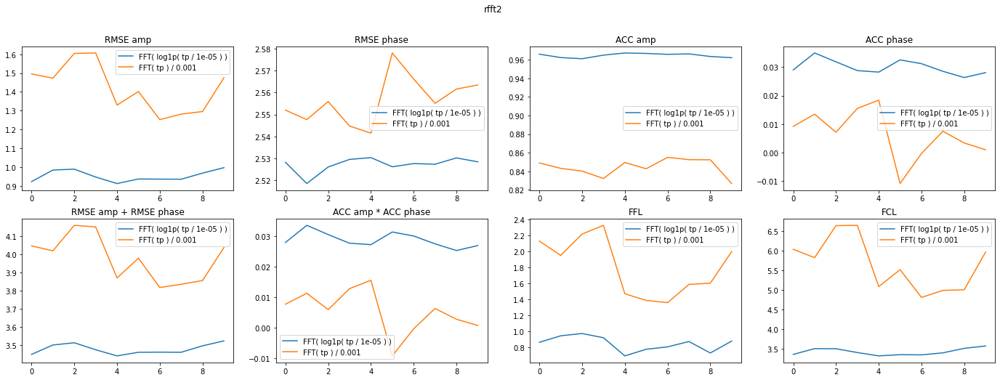

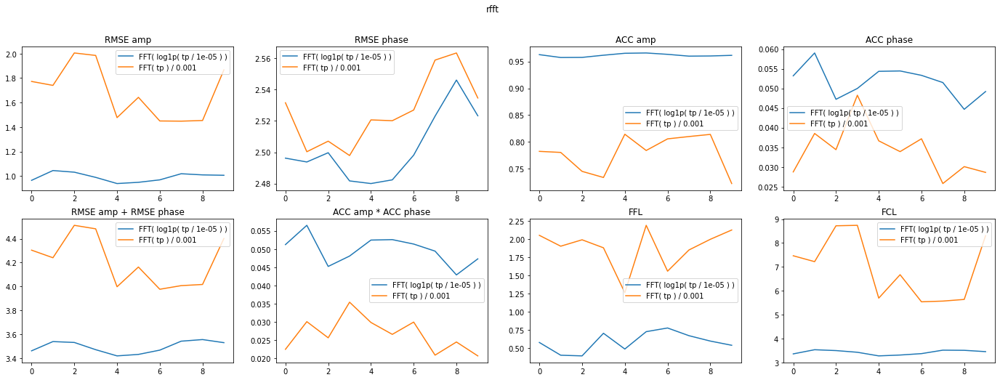

In [10]:
for fn_name in spectra_fns.keys():

    plt.figure(figsize=(24,8))

    plt.subplot(2,4,1)
    plt.plot(np.arange(10), spec_metrics[fn_name]['rmse_amp'], label=f'FFT( log1p( tp / {trainer.params.precip_eps} ) )')
    plt.plot(np.arange(10), spec_sc_metrics[fn_name]['rmse_amp'], label=f'FFT( tp ) / {spectra_eps}')
    plt.legend()
    plt.title('RMSE amp')

    plt.subplot(2,4,2)
    plt.plot(np.arange(10), spec_metrics[fn_name]['rmse_phase'], label=f'FFT( log1p( tp / {trainer.params.precip_eps} ) )')
    plt.plot(np.arange(10), spec_sc_metrics[fn_name]['rmse_phase'], label=f'FFT( tp ) / {spectra_eps}')
    plt.legend()
    plt.title('RMSE phase')

    plt.subplot(2,4,3)
    plt.plot(np.arange(10), spec_metrics[fn_name]['acc_amp'], label=f'FFT( log1p( tp / {trainer.params.precip_eps} ) )')
    plt.plot(np.arange(10), spec_sc_metrics[fn_name]['acc_amp'], label=f'FFT( tp ) / {spectra_eps}')
    plt.legend()
    plt.title('ACC amp')

    plt.subplot(2,4,4)
    plt.plot(np.arange(10), spec_metrics[fn_name]['acc_phase'], label=f'FFT( log1p( tp / {trainer.params.precip_eps} ) )')
    plt.plot(np.arange(10), spec_sc_metrics[fn_name]['acc_phase'], label=f'FFT( tp ) / {spectra_eps}')
    plt.legend()
    plt.title('ACC phase')

    plt.subplot(2,4,5)
    plt.plot(np.arange(10), np.array(spec_metrics[fn_name]['rmse_amp']) + np.array(spec_metrics[fn_name]['rmse_phase']), label=f'FFT( log1p( tp / {trainer.params.precip_eps} ) )')
    plt.plot(np.arange(10), np.array(spec_sc_metrics[fn_name]['rmse_amp']) + np.array(spec_sc_metrics[fn_name]['rmse_phase']), label=f'FFT( tp ) / {spectra_eps}')
    plt.legend()
    plt.title('RMSE amp + RMSE phase')

    plt.subplot(2,4,6)
    plt.plot(np.arange(10), np.array(spec_metrics[fn_name]['acc_amp']) * np.array(spec_metrics[fn_name]['acc_phase']), label=f'FFT( log1p( tp / {trainer.params.precip_eps} ) )')
    plt.plot(np.arange(10), np.array(spec_sc_metrics[fn_name]['acc_amp']) * np.array(spec_sc_metrics[fn_name]['acc_phase']), label=f'FFT( tp ) / {spectra_eps}')
    plt.legend()
    plt.title('ACC amp * ACC phase')

    plt.subplot(2,4,7)
    plt.plot(np.arange(10), spec_metrics[fn_name]['ffl'], label=f'FFT( log1p( tp / {trainer.params.precip_eps} ) )')
    plt.plot(np.arange(10), spec_sc_metrics[fn_name]['ffl'], label=f'FFT( tp ) / {spectra_eps}')
    plt.legend()
    plt.title('FFL')

    plt.subplot(2,4,8)
    plt.plot(np.arange(10), spec_metrics[fn_name]['fcl'], label=f'FFT( log1p( tp / {trainer.params.precip_eps} ) )')
    plt.plot(np.arange(10), spec_sc_metrics[fn_name]['fcl'], label=f'FFT( tp ) / {spectra_eps}')
    plt.legend()
    plt.title('FCL')
    
    plt.suptitle(f'{fn_name}')

    plt.show()

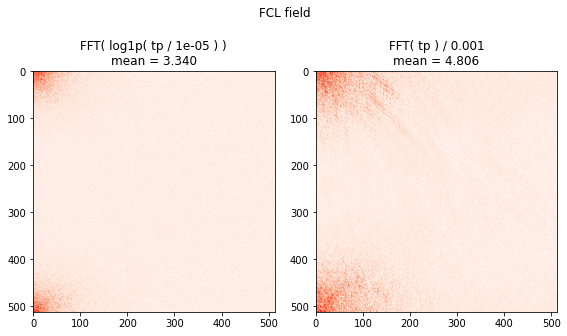

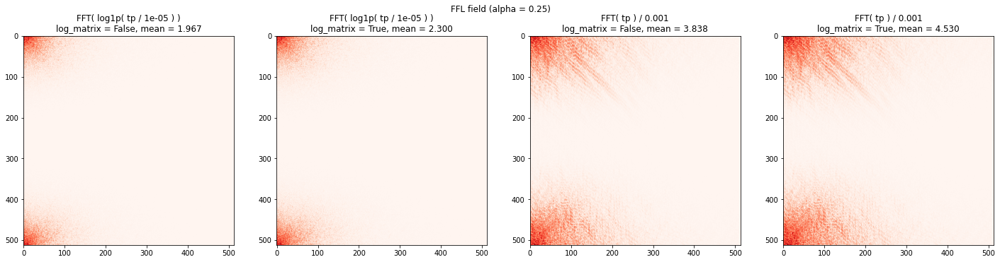

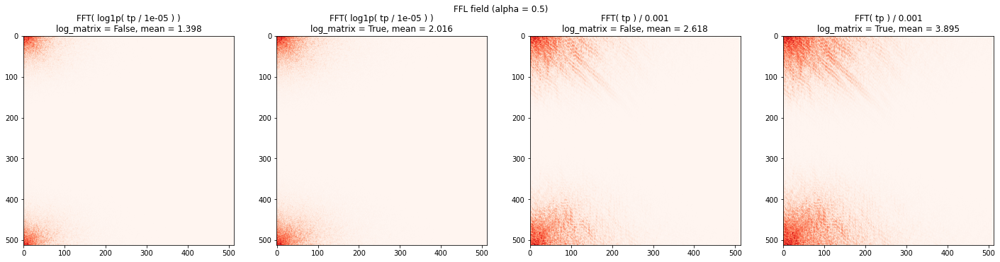

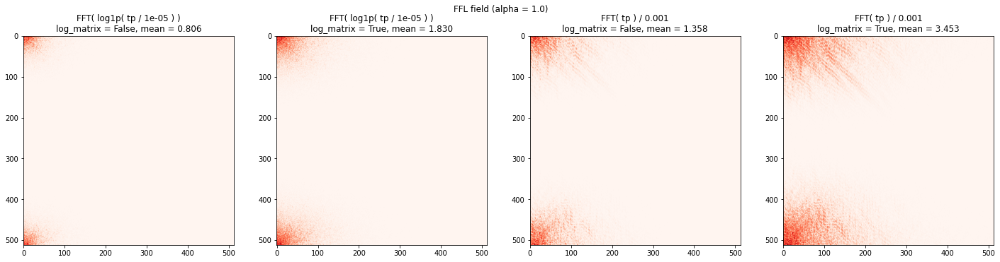

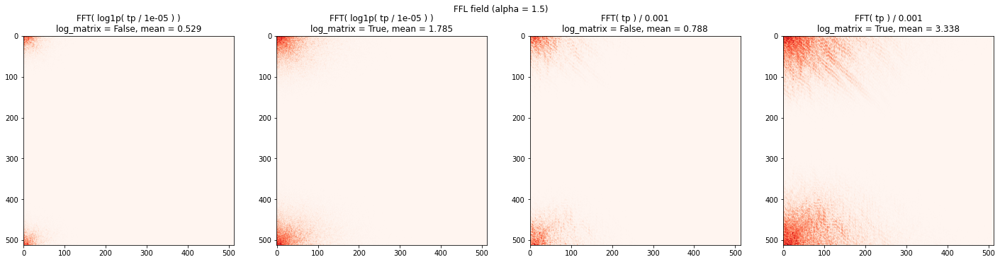

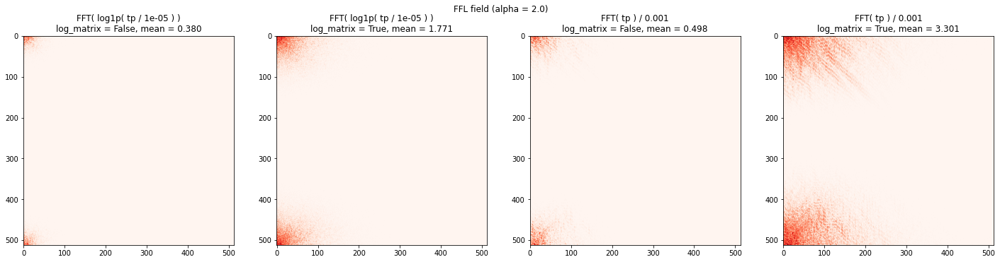

In [6]:
pred = torch.tensor(fields['pred'][viz_idx], requires_grad=False)[None, :].to('cuda:0')
tar = torch.tensor(fields['target'][viz_idx], requires_grad=False)[None, :].to('cuda:0')

p_fft = torch.fft.rfft2(pred, norm='ortho')
t_fft = torch.fft.rfft2(tar, norm='ortho')

p_fft_sc = torch.fft.rfft2(unlog_tp_torch(pred), norm='ortho') / spectra_eps
t_fft_sc = torch.fft.rfft2(unlog_tp_torch(tar), norm='ortho') / spectra_eps

# plot FCL field
plt.figure(figsize=(8,5))
cmap = 'Reds'

for fft_scaled in [False, True]:
        
    if fft_scaled:
        plt_idx = 2
        pred_fft = p_fft_sc
        tar_fft = t_fft_sc
        fft_label = f'FFT( tp ) / {spectra_eps}'
    else:
        plt_idx = 1
        pred_fft = p_fft
        tar_fft = t_fft
        fft_label = f'FFT( log1p( tp / {trainer.params.precip_eps} ) )'
        
    fcl_field = fcl_torch(pred_fft.abs(), pred_fft.angle(), tar_fft.abs(), tar_fft.angle())[0, 0].cpu().numpy()
    
    plt.subplot(1,2,plt_idx)
    plt.imshow(np.log1p(fcl_field), cmap=cmap)
    plt.title(fft_label + f'\nmean = {np.mean(fcl_field):.3f}')

plt.suptitle(f'FCL field')
plt.tight_layout()
plt.show()

alphas = [0.25, 0.5, 1., 1.5, 2.]

log_matrix = False
batch_matrix = False    

# plot FFL field for different levels of alpha
for alpha in alphas:
    
    plt.figure(figsize=(20,5))
    cmap = 'Reds'
    
    for fft_scaled in [False, True]:
        
        if fft_scaled:
            plt_idx = 3
            pred_fft = p_fft_sc
            tar_fft = t_fft_sc
            fft_label = f'FFT( tp ) / {spectra_eps}'
        else:
            plt_idx = 1
            pred_fft = p_fft
            tar_fft = t_fft
            fft_label = f'FFT( log1p( tp / {trainer.params.precip_eps} ) )'
            
        for log_matrix in [False, True]:

            ffl_field = ffl_torch(pred_fft, tar_fft, alpha=alpha, log_matrix=log_matrix)[0, 0].cpu().numpy()

            plt.subplot(1,4,plt_idx+log_matrix)
            plt.imshow(np.log1p(ffl_field), cmap=cmap)
            plt.title(fft_label + f'\nlog_matrix = {log_matrix}, mean = {np.mean(ffl_field):.3f}')
        
    plt.suptitle(f'FFL field (alpha = {alpha})')
    plt.tight_layout()
    plt.show()

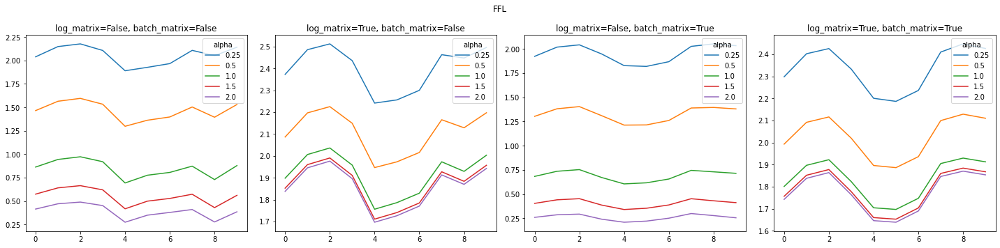

In [7]:
plt.figure(figsize=(20,5))

with torch.inference_mode():

    preds = torch.tensor(np.array(fields['pred']), requires_grad=False).to('cuda:0')
    tars = torch.tensor(np.array(fields['target']), requires_grad=False).to('cuda:0')

    preds_fft = torch.fft.rfft2(preds, norm='ortho')
    tars_fft = torch.fft.rfft2(tars, norm='ortho')
    
    for log in [False, True]:
        
        for batch in [False, True]:

            plt.subplot(1,4,log+(not batch)+3*batch)

            for i, alpha in enumerate(alphas):

                ffl_means = torch.mean(ffl_torch(preds_fft, tars_fft, alpha=alpha, log_matrix=log, batch_matrix=batch), dim=[1, 2, 3]).cpu().numpy()

                plt.plot(np.arange(len(fields['pred'])), ffl_means, label=f'{alpha}')

            plt.legend(title='alpha')
            plt.title(f'log_matrix={log}, batch_matrix={batch}')

plt.suptitle('FFL')
plt.tight_layout()
plt.show()

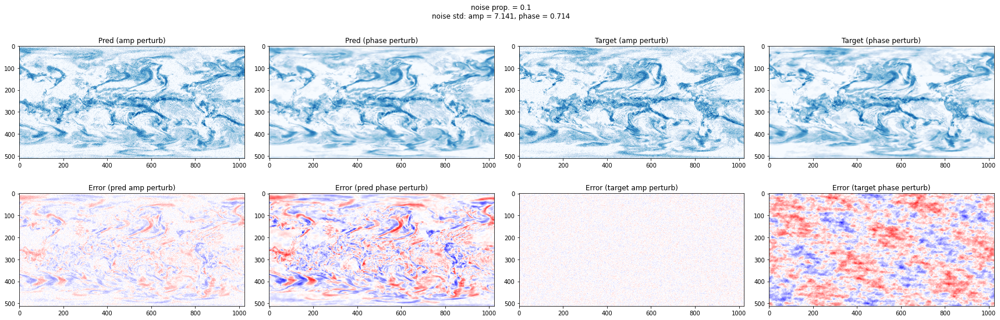

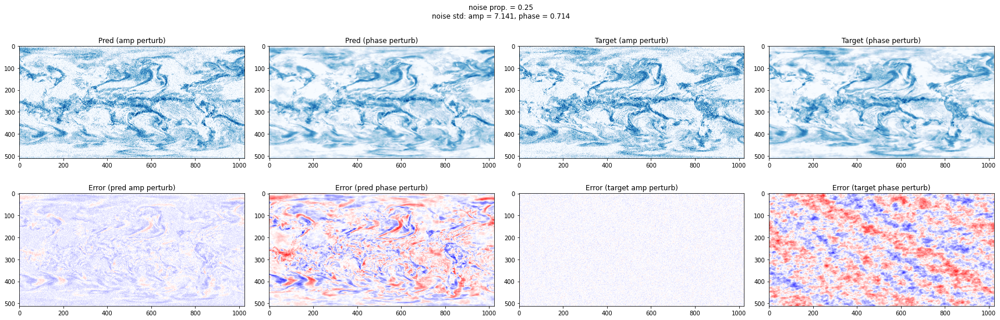

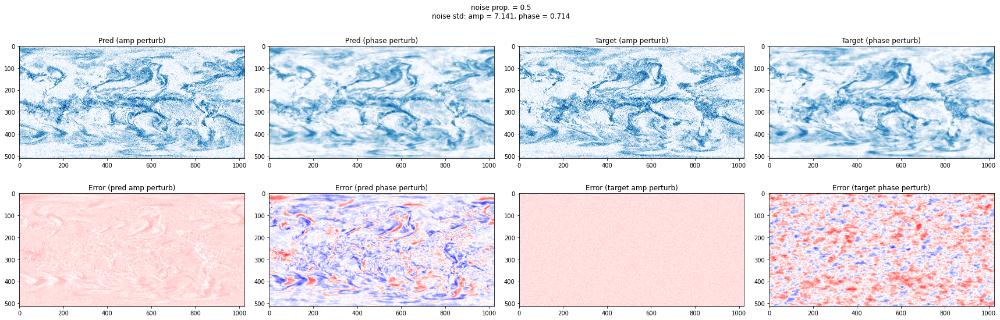

In [95]:
noise_lvls = 100
noise_lvls_fig = [50]

# maybe rescale amp to (0, 2*pi)?
pred_amp = preds_fft.abs()
pred_phase = preds_fft.angle()
tar_amp = tars_fft.abs()
tar_phase = tars_fft.angle()

experiments = {}

tar_viz = fields['target'][viz_idx][0]
sc = tar_viz.max()

tars_unlog = unlog_tp_torch(tars, trainer.params.precip_eps)

with torch.inference_mode():
    
    for inv_noise_prop in [10, 4, 2]:
    
        # add noise to each img's freqs 
        # the perturbed pixels are the same for every noise level 
        size_noise = (pred_amp.shape[-1] * pred_amp.shape[-2]) // inv_noise_prop
        x = torch.tensor(np.random.randint(pred_amp.shape[-1], size=size_noise)) 
        y = torch.tensor(np.random.randint(pred_amp.shape[-2], size=size_noise))
        noise = torch.zeros(tar_amp.shape).to('cuda:0')
        noise_shape = noise[:, :, y, x].shape

        for i in range(noise_lvls):

            noise_std = np.sqrt((i + 1) / noise_lvls)
            noise[:, :, y, x] = torch.randn(noise_shape).to('cuda:0') * noise_std

            pred_ampy = (pred_amp + 10 * noise).abs()
            pred_phasey = pred_phase + noise

            tar_ampy = (tar_amp + 10 * noise).abs()
            tar_phasey = tar_phase + noise

            pred_ampy_fft = pred_ampy * torch.cos(pred_phase) + torch.tensor(1j) * pred_ampy * torch.sin(pred_phase)
            pred_phasey_fft = pred_amp * torch.cos(pred_phasey) + torch.tensor(1j) * pred_amp * torch.sin(pred_phasey)

            tar_ampy_fft = tar_ampy * torch.cos(tar_phase) + torch.tensor(1j) * tar_ampy * torch.sin(tar_phase)
            tar_phasey_fft = tar_amp * torch.cos(tar_phasey) + torch.tensor(1j) * tar_amp * torch.sin(tar_phasey)

            pred_ampy = torch.fft.irfft2(pred_ampy_fft, norm='ortho')
            pred_phasey = torch.fft.irfft2(pred_phasey_fft, norm='ortho')

            tar_ampy = torch.fft.irfft2(tar_ampy_fft, norm='ortho')
            tar_phasey = torch.fft.irfft2(tar_phasey_fft, norm='ortho')

            for name, recon, recon_fft in [('pred_ampy', pred_ampy, pred_ampy_fft), 
                                                  ('pred_phasey', pred_phasey, pred_phasey_fft), 
                                                  ('tar_ampy', tar_ampy, tar_ampy_fft), 
                                                  ('tar_phasey', tar_phasey, tar_phasey_fft)]:
                
                metric_dict = experiments.setdefault('all_metrics', {}).setdefault(inv_noise_prop, {}).setdefault(name, {})
                        
                # recon = unlog_tp_torch(recon, trainer.params.precip_eps)
                metric_dict.setdefault('rmse', []).append(torch.mean(weighted_rmse_torch_channels(recon, tars)).item())
                metric_dict.setdefault('1 - acc', []).append(1 - torch.mean(weighted_acc_torch_channels(recon, tars)).item())
                
                metrics_spec = spectra_metrics_fft_input(recon_fft, tars_fft)
                metric_dict.setdefault('rmse_fft', []).append(metrics_spec['rmse_amp'].item() + metrics_spec['rmse_phase'].item())
                metric_dict.setdefault('1 - acc_fft', []).append(1 - metrics_spec['acc_amp'].item() * metrics_spec['acc_phase'].item())
                metric_dict.setdefault('fcl', []).append(metrics_spec['fcl'].item())
                metric_dict.setdefault('ffl', []).append(metrics_spec['ffl'].item())
                
                ffl_metric_dict = experiments.setdefault('ffl_params', {}).setdefault(inv_noise_prop, {}).setdefault(name, {})
                ffl_metric_dict.setdefault('alpha=0.5', []).append(torch.mean(ffl_torch(recon_fft, tars_fft, alpha=0.5)).item())
                ffl_metric_dict.setdefault('alpha=2.0', []).append(torch.mean(ffl_torch(recon_fft, tars_fft, alpha=2.)).item())
                ffl_metric_dict.setdefault('alpha=0.5, batch', []).append(torch.mean(ffl_torch(recon_fft, tars_fft, alpha=0.5, batch_matrix=True)).item())
                ffl_metric_dict.setdefault('alpha=2.0, batch', []).append(torch.mean(ffl_torch(recon_fft, tars_fft, alpha=2., batch_matrix=True)).item())
                ffl_metric_dict.setdefault('alpha=0.5, log', []).append(torch.mean(ffl_torch(recon_fft, tars_fft, alpha=0.5, log_matrix=True)).item())
                ffl_metric_dict.setdefault('alpha=2.0, log', []).append(torch.mean(ffl_torch(recon_fft, tars_fft, alpha=2., log_matrix=True)).item())
                ffl_metric_dict.setdefault('alpha=0.5, batch, log', []).append(torch.mean(ffl_torch(recon_fft, tars_fft, alpha=0.5, batch_matrix=True, log_matrix=True)).item())
                ffl_metric_dict.setdefault('alpha=2.0, batch, log', []).append(torch.mean(ffl_torch(recon_fft, tars_fft, alpha=2., batch_matrix=True, log_matrix=True)).item())
                

            if i in noise_lvls_fig:
                
                pred_ampy = pred_ampy[viz_idx, 0].cpu().numpy()
                pred_phasey = pred_phasey[viz_idx, 0].cpu().numpy()

                tar_ampy = tar_ampy[viz_idx, 0].cpu().numpy()
                tar_phasey = tar_phasey[viz_idx, 0].cpu().numpy()

                fig = plt.figure(figsize=(24,8))

                plt.subplot(2,4,1)
                plt.imshow(pred_ampy, cmap='Blues', norm=Normalize(0., sc))
                plt.title('Pred (amp perturb)')

                plt.subplot(2,4,2)
                plt.imshow(pred_phasey, cmap='Blues', norm=Normalize(0., sc))
                plt.title('Pred (phase perturb)')

                plt.subplot(2,4,3)
                plt.imshow(tar_ampy, cmap='Blues', norm=Normalize(0., sc))
                plt.title('Target (amp perturb)')

                plt.subplot(2,4,4)
                plt.imshow(tar_phasey, cmap='Blues', norm=Normalize(0., sc))
                plt.title('Target (phase perturb)')

                plt.subplot(2,4,5)
                plt.imshow(pred_ampy - tar_viz, cmap='bwr')
                plt.title('Error (pred amp perturb)')

                plt.subplot(2,4,6)
                plt.imshow(pred_phasey - tar_viz, cmap='bwr')
                plt.title('Error (pred phase perturb)')

                plt.subplot(2,4,7)
                plt.imshow(tar_ampy - tar_viz, cmap='bwr')
                plt.title('Error (target amp perturb)')

                plt.subplot(2,4,8)
                plt.imshow(tar_phasey - tar_viz, cmap='bwr')
                plt.title('Error (target phase perturb)')

                plt.suptitle(f'noise prop. = {1/inv_noise_prop}\nnoise std: amp = {10*noise_std:.3f}, phase = {noise_std:.3f}')
                plt.tight_layout()

                plt.show()

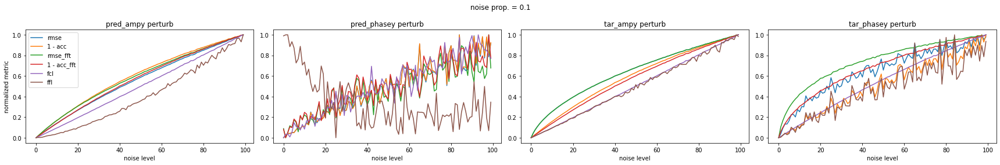

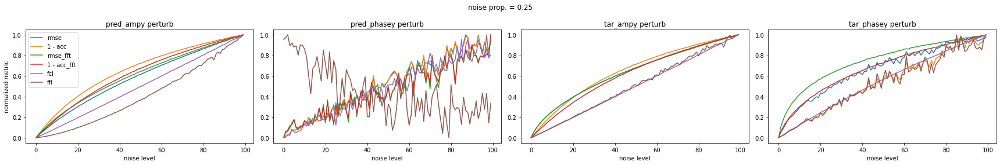

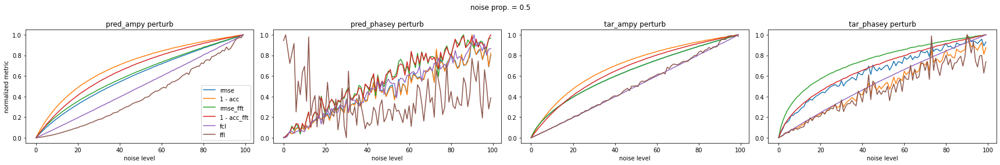

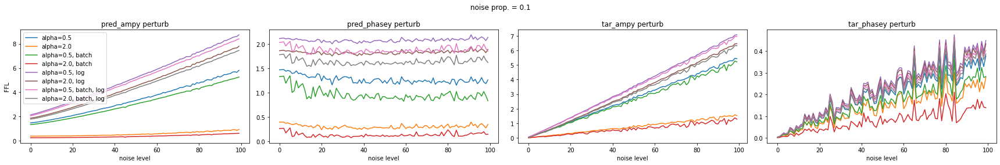

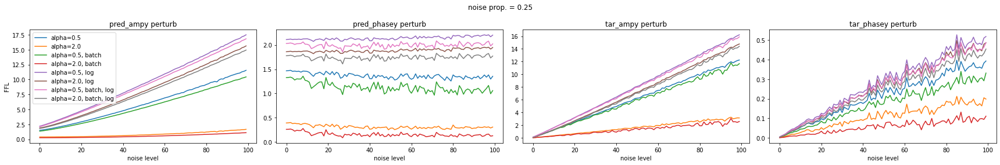

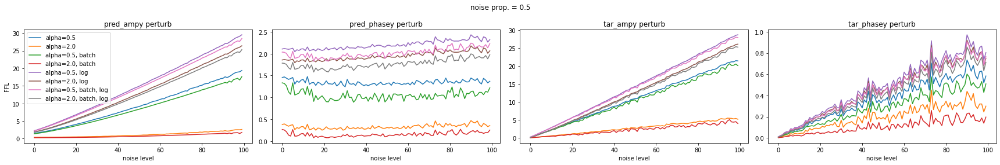

In [98]:
for exp_name, inv_noise_prop_dict in experiments.items():
        
    for inv_noise_prop, perturb_dict in inv_noise_prop_dict.items():
        
        plt.figure(figsize=(24,4))
            
        for j, (perturb_name, metrics) in enumerate(perturb_dict.items()):

            plt.subplot(1,4,j+1)

            for key, metric in metrics.items():
                metric = np.array(metric)
                if exp_name == 'all_metrics':
                    # normalize to [0,1]    
                    metric = 1 - (metric.max() - metric) / (metric.max() - metric.min())
                # elif exp_name == 'ffl_params':
                    # metric = np.log(metric)
                    
                plt.plot(np.arange(noise_lvls), metric, label=key)
                plt.xlabel('noise level')
                plt.title(f'{perturb_name} perturb')

            if j == 0:
                plt.legend(fontsize=10)
                if exp_name == 'all_metrics':
                    plt.ylabel('normalized metric')
                elif exp_name == 'ffl_params':
                    # plt.ylabel('log(FFL)')
                    plt.ylabel('FFL')
                    
        plt.suptitle(f'noise prop. = {1/inv_noise_prop}')
        plt.tight_layout()
        plt.show()

In [91]:
experiments['all_metrics'][10]['pred_ampy'].keys()

dict_keys(['rmse', '1 - acc', 'rmse_fft', '1 - acc_fft', 'fcl', 'ffl'])

In [69]:
metrics['ffl_metrics'] = ffl_metrics

In [50]:
tars_unlog.shape

torch.Size([10, 1, 512, 1024])

In [11]:
size_noise = (pred_amp.shape[-1] * pred_amp.shape[-2]) // 10
x = torch.tensor(np.random.randint(pred_amp.shape[-1], size=size_noise))# size=pred_amp.shape[-1]))# # 
y = torch.tensor(np.random.randint(pred_amp.shape[-2], size=size_noise))# size=pred_amp.shape[-2]))# size=size_noise))#
noise_idx = torch.stack(torch.meshgrid(y, x))

noise = torch.zeros(pred_amp.shape)
# noise_shape = noise[:, :, noise_idx[0], noise_idx[1]].shape
# noise[:, :, noise_idx[0], noise_idx[1]] = 1 # torch.randn(noise_shape)
noise_shape = noise[:, :, y, x].shape
print(noise_shape)

# noise_idx = torch.meshgrid(y, x)
# noise = torch.zeros(pred_amp.shape)
noise[:, :, y, x] = 1
assert noise.sum() < 10 * size_noise
noise.sum() / noise.numel()

torch.Size([10, 1, 26265])


tensor(0.0950)

In [283]:
noise.sum() / noise.numel()

tensor(0.1679)

In [274]:
25**4 / noise.numel()

0.148721140960039

In [271]:
noise_idx.shape

torch.Size([2, 25, 25])

In [226]:
noise_idx

tensor([[[337, 337, 337,  ..., 337, 337, 337],
         [325, 325, 325,  ..., 325, 325, 325],
         [ 13,  13,  13,  ...,  13,  13,  13],
         ...,
         [333, 333, 333,  ..., 333, 333, 333],
         [198, 198, 198,  ..., 198, 198, 198],
         [174, 174, 174,  ..., 174, 174, 174]],

        [[369, 461, 464,  ..., 122, 315, 121],
         [369, 461, 464,  ..., 122, 315, 121],
         [369, 461, 464,  ..., 122, 315, 121],
         ...,
         [369, 461, 464,  ..., 122, 315, 121],
         [369, 461, 464,  ..., 122, 315, 121],
         [369, 461, 464,  ..., 122, 315, 121]]])

In [219]:
noise.numel()

2626560

In [232]:
noise.sum()

tensor(27040.)

In [231]:
n_noise

262650

In [154]:
[noise[i].sum() for i in range(noise.shape[0])]

[tensor(24984.),
 tensor(24984.),
 tensor(24984.),
 tensor(24984.),
 tensor(24984.),
 tensor(24984.),
 tensor(24984.),
 tensor(24984.),
 tensor(24984.),
 tensor(24984.)]

In [156]:
noise.sum() / (10*512*513)

tensor(0.0951)

In [90]:
np.stack((y, x)).shape

(2, 512)

In [58]:
y[1], x[1]

(421, 128)

In [41]:
pred_amp.stride()

(262656, 262656, 513, 1)

In [22]:
noise[:, :, y][:, :, :, x].shape

torch.Size([10, 1, 512, 513])